In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
# Helper function to compute Sum of Absolute Differences (SAD)
def compute_sad(left, right, window_size):
    height, width = left.shape
    disparity_map = np.zeros((height, width), dtype=np.float32)
    half_window = window_size // 2

    for y in range(half_window, height - half_window):
        for x in range(half_window, width - half_window):
            best_disparity = 0
            min_sad = float('inf')

            for d in range(0, min(50, x - half_window)):  # Maximum disparity
                sad = np.sum(
                    np.abs(
                        left[y - half_window:y + half_window + 1, x - half_window:x + half_window + 1] -
                        right[y - half_window:y + half_window + 1, x - d - half_window:x - d + half_window + 1]
                    )
                )

                if sad < min_sad:
                    min_sad = sad
                    best_disparity = d

            disparity_map[y, x] = best_disparity

    return disparity_map

In [3]:
# Helper function to compute Sum of Squared Differences (SSD)
def compute_ssd(left, right, window_size):
    height, width = left.shape
    disparity_map = np.zeros((height, width), dtype=np.float32)
    half_window = window_size // 2

    for y in range(half_window, height - half_window):
        for x in range(half_window, width - half_window):
            best_disparity = 0
            min_ssd = float('inf')

            for d in range(0, min(50, x - half_window)):  # Maximum disparity
                ssd = np.sum(
                    (
                        left[y - half_window:y + half_window + 1, x - half_window:x + half_window + 1] -
                        right[y - half_window:y + half_window + 1, x - d - half_window:x - d + half_window + 1]
                    ) ** 2
                )

                if ssd < min_ssd:
                    min_ssd = ssd
                    best_disparity = d

            disparity_map[y, x] = best_disparity

    return disparity_map

In [30]:
def visualize_alignment(alignment_path):
    """Visualize alignment path between left and right scanlines."""
    plt.figure(figsize=(8, 8))
    for k in range(1, len(alignment_path)):
        i1, j1 = alignment_path[k - 1]
        i2, j2 = alignment_path[k]
        if i2 == i1 + 1 and j2 == j1 + 1:  # Match: diagonal
            plt.plot([i1, i2], [j1, j2], 'g-')  # Green diagonal line
        elif i2 == i1 + 1:  # Skip in right image: vertical line
            plt.plot([i1, i2], [j1, j1], 'r-')  # Red vertical line
        elif j2 == j1 + 1:  # Skip in left image: horizontal line
            plt.plot([i1, i1], [j1, j2], 'b-')  # Blue horizontal line
    
    plt.title("Alignment Visualization")
    plt.xlabel("Left Scanline Pixels (i)")
    plt.ylabel("Right Scanline Pixels (j)")
    plt.gca().invert_yaxis()  # Flip Y-axis for clarity
    plt.grid()
    plt.show()

In [33]:
def compute_disparity_dynamic_programming(left_image, right_image, sigma=2, c0=1):
    h, w = left_image.shape
    disparity_map = np.zeros((h, w), dtype=np.float32)

    for row in range(h):
        left_scanline = left_image[row]
        right_scanline = right_image[row]
        n = len(left_scanline)
        
        # Initialize cost matrix D
        D = np.full((n, n), np.inf)
        D[0, 0] = ((left_scanline[0] - right_scanline[0]) ** 2) / sigma**2
        
        # Fill cost matrix
        for i in range(1, n):
            D[i, 0] = D[i - 1, 0] + c0  # Skipping right pixel
            D[0, i] = D[0, i - 1] + c0  # Skipping left pixel
        
        for i in range(1, n):
            for j in range(1, n):
                match_cost = ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2
                D[i, j] = min(
                    D[i - 1, j - 1] + match_cost,  # Match
                    D[i - 1, j] + c0,             # Skip in right image
                    D[i, j - 1] + c0              # Skip in left image
                )
        
        # Backtrack to compute disparity
        i, j = n - 1, n - 1
        alignment_path = []
        disparity_row = np.zeros(n, dtype=np.float32)
        while i > 0 and j > 0:
            alignment_path.append((i, j))
            if i > 0 and j > 0 and D[i, j] == D[i - 1, j - 1] + ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2:
                disparity_row[i] = abs(i - j)  # Disparity is the pixel offset
                i -= 1
                j -= 1
            elif i > 0 and D[i, j] == D[i - 1, j] + c0:
                i -= 1  # Skip in left image
            else:
                j -= 1  # Skip in right image

        alignment_path.append((0, 0))  # Add the starting point
        alignment_path.reverse()
        # Save disparity for the row
        disparity_map[row] = disparity_row
        
    
    visualize_alignment(alignment_path)
    return disparity_map

In [9]:
def display_disparity_map(disparity_map,title="Disparity Map"):
    plt.imshow(disparity_map, cmap='gray')
    plt.colorbar()
    plt.title(title)
    plt.show()

In [ ]:
def display_images_with_matplotlib(image_path1, image_path2, title1="Image 1", title2="Image 2"):
    """
    Function to display two images side-by-side using Matplotlib.
    
    Parameters:
        image_path1 (str): Path to the first image file.
        image_path2 (str): Path to the second image file.
        title1 (str): Title for the first image.
        title2 (str): Title for the second image.
    """
    try:
        # Load the images
        img1 = mpimg.imread(image_path1)
        img2 = mpimg.imread(image_path2)
        
        # Create subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns

        # Plot the first image
        axes[0].imshow(img1)
        axes[0].axis("off")  # Hide axes
        axes[0].set_title(title1)  # Set title for the first image

        # Plot the second image
        axes[1].imshow(img2)
        axes[1].axis("off")  # Hide axes
        axes[1].set_title(title2)  # Set title for the second image

        # Adjust layout and display
        plt.tight_layout()
        plt.show()

    except FileNotFoundError as e:
        print(f"Error: {e}")

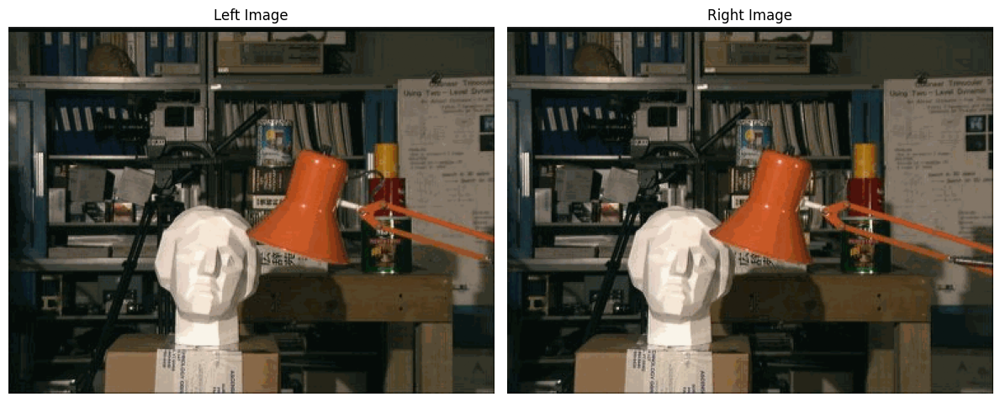

In [18]:
# Example usage
display_images_with_matplotlib("l1.png", "r1.png", title1="Left Image", title2="Right Image")


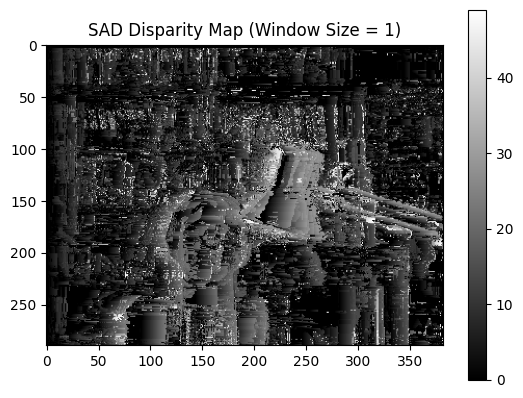

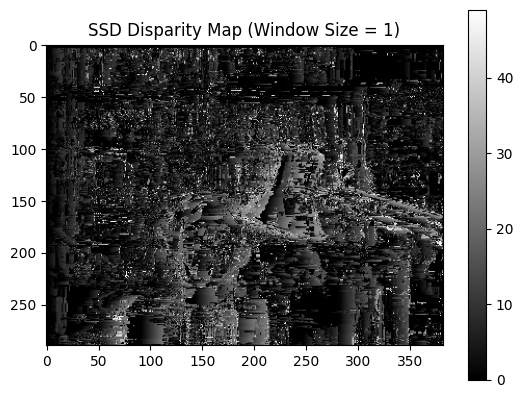

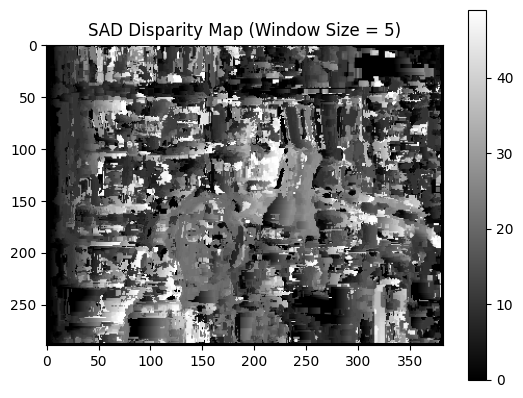

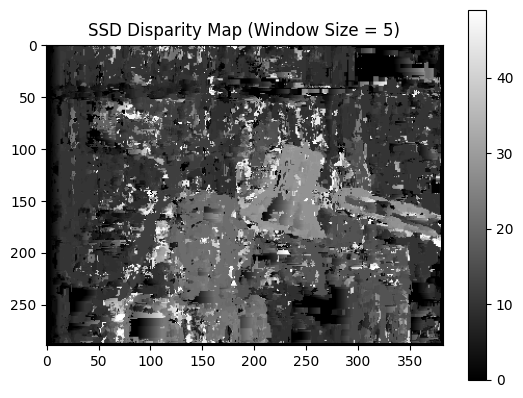

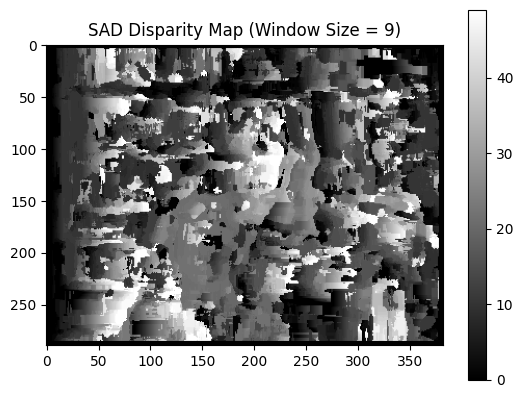

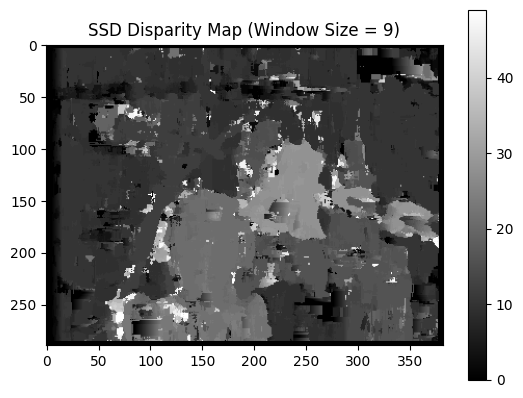

In [12]:
# Main function to test the implementation
if __name__ == "__main__":
    # Load grayscale images
    left_image = cv2.imread('l1.png', cv2.IMREAD_GRAYSCALE)
    right_image = cv2.imread('r1.png', cv2.IMREAD_GRAYSCALE)

    # Block matching with SAD and SSD
    window_sizes = [1, 5, 9]
    for w in window_sizes:
        sad_disparity = compute_sad(left_image, right_image, w)
        ssd_disparity = compute_ssd(left_image, right_image, w)

        display_disparity_map(sad_disparity, f"SAD Disparity Map (Window Size = {w})")
        display_disparity_map(ssd_disparity, f"SSD Disparity Map (Window Size = {w})")

C:\Users\02rad\AppData\Local\Temp\ipykernel_17664\1332895901.py:21: RuntimeWarning: overflow encountered in scalar subtract
  match_cost = ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2
C:\Users\02rad\AppData\Local\Temp\ipykernel_17664\1332895901.py:32: RuntimeWarning: overflow encountered in scalar subtract
  if i > 0 and j > 0 and D[i, j] == D[i - 1, j - 1] + ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2:
C:\Users\02rad\AppData\Local\Temp\ipykernel_17664\1332895901.py:12: RuntimeWarning: overflow encountered in scalar subtract
  D[0, 0] = ((left_scanline[0] - right_scanline[0]) ** 2) / sigma**2


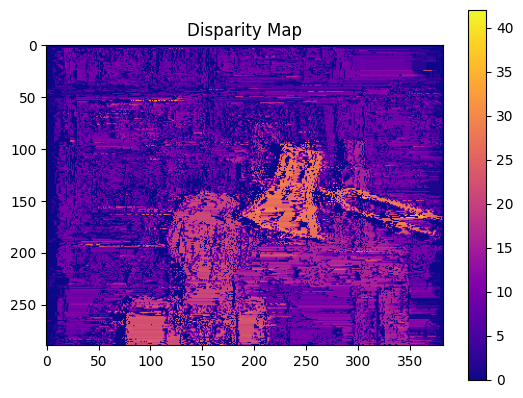

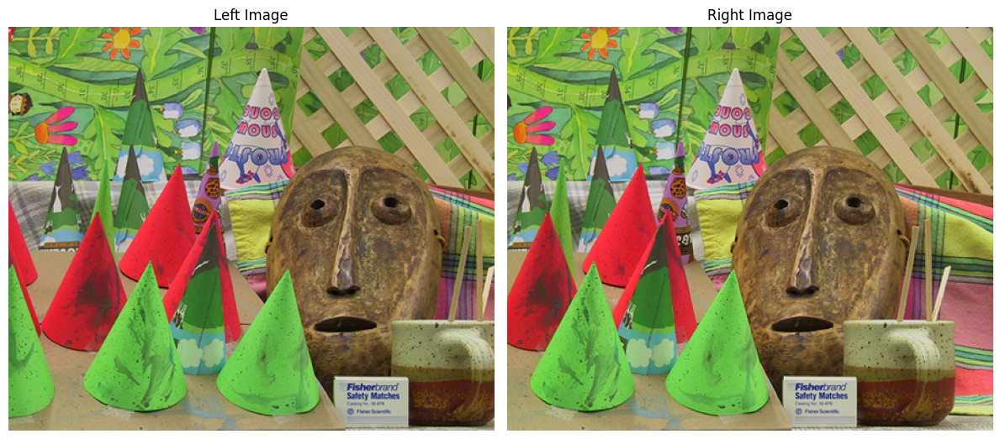

In [19]:
display_images_with_matplotlib("l2.png", "r2.png", title1="Left Image", title2="Right Image")

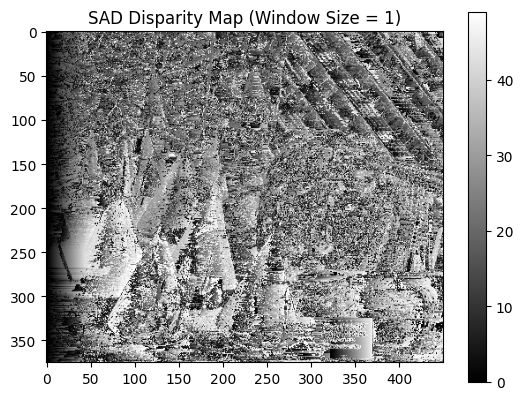

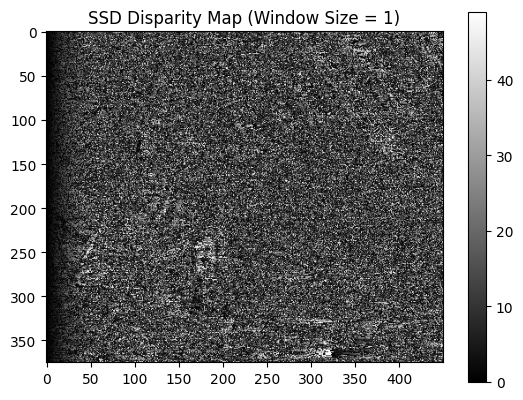

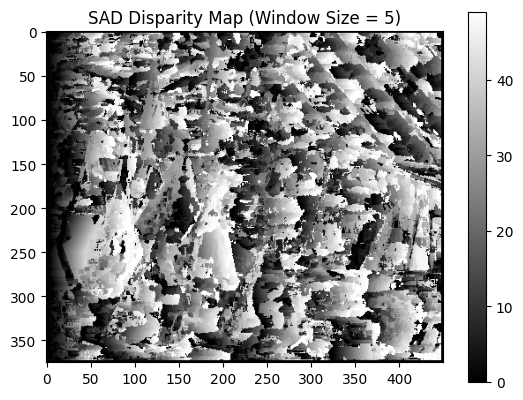

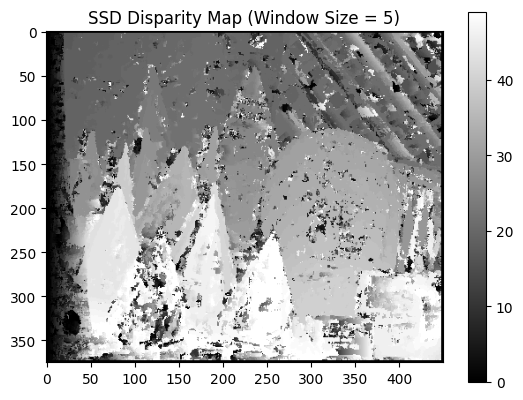

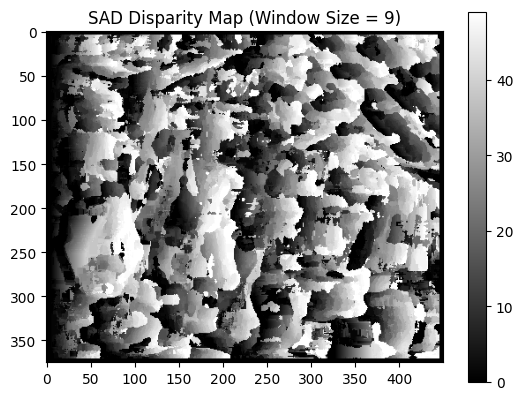

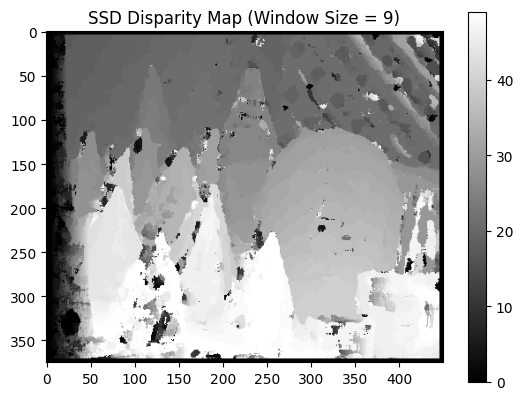

In [11]:
# Main function to test the implementation
if __name__ == "__main__":
    # Load grayscale images
    left_image = cv2.imread('l2.png', cv2.IMREAD_GRAYSCALE)
    right_image = cv2.imread('r2.png', cv2.IMREAD_GRAYSCALE)

    # Block matching with SAD and SSD
    window_sizes = [1, 5, 9]
    for w in window_sizes:
        sad_disparity = compute_sad(left_image, right_image, w)
        ssd_disparity = compute_ssd(left_image, right_image, w)

        display_disparity_map(sad_disparity, f"SAD Disparity Map (Window Size = {w})")
        display_disparity_map(ssd_disparity, f"SSD Disparity Map (Window Size = {w})")

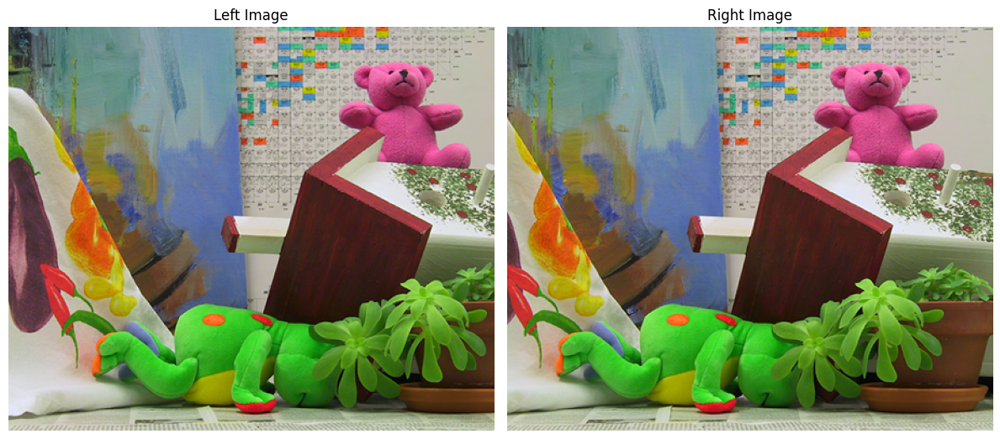

In [20]:
display_images_with_matplotlib("l3.png", "r3.png", title1="Left Image", title2="Right Image")


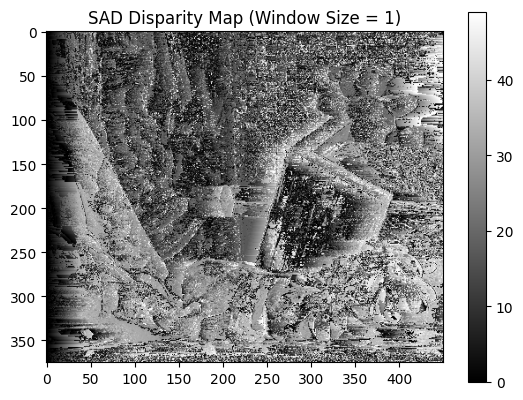

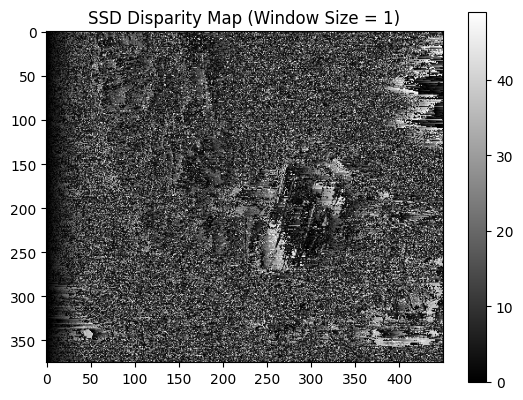

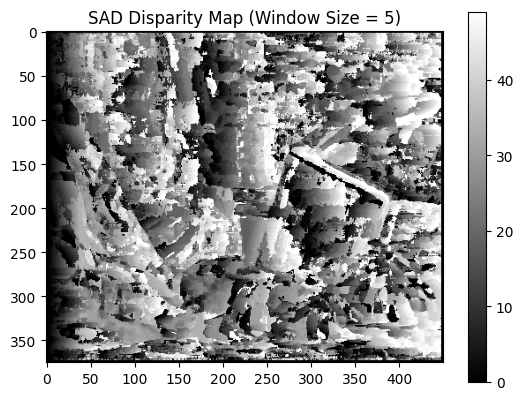

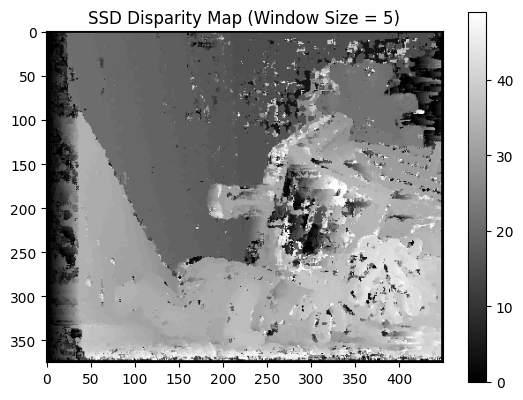

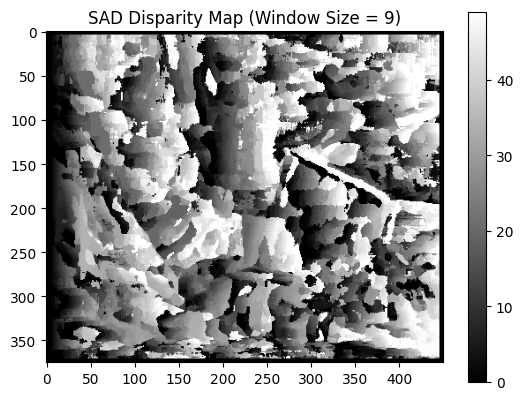

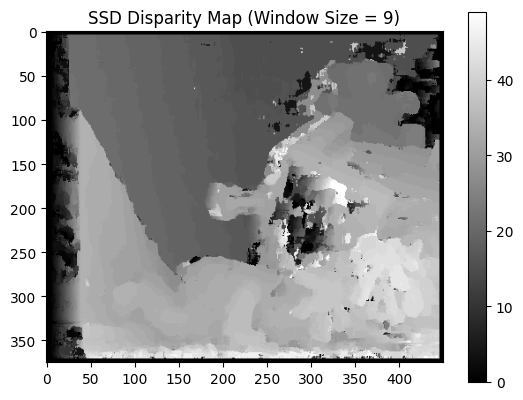

In [10]:
# Main function to test the implementation
if __name__ == "__main__":
    # Load grayscale images
    left_image = cv2.imread('l3.png', cv2.IMREAD_GRAYSCALE)
    right_image = cv2.imread('r3.png', cv2.IMREAD_GRAYSCALE)

    # Block matching with SAD and SSD
    window_sizes = [1, 5, 9]
    for w in window_sizes:
        sad_disparity = compute_sad(left_image, right_image, w)
        ssd_disparity = compute_ssd(left_image, right_image, w)

        display_disparity_map(sad_disparity, f"SAD Disparity Map (Window Size = {w})")
        display_disparity_map(ssd_disparity, f"SSD Disparity Map (Window Size = {w})")

## Dynamic Programming

C:\Users\02rad\AppData\Local\Temp\ipykernel_24104\1332895901.py:21: RuntimeWarning: overflow encountered in scalar subtract
  match_cost = ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2
C:\Users\02rad\AppData\Local\Temp\ipykernel_24104\1332895901.py:32: RuntimeWarning: overflow encountered in scalar subtract
  if i > 0 and j > 0 and D[i, j] == D[i - 1, j - 1] + ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2:
C:\Users\02rad\AppData\Local\Temp\ipykernel_24104\1332895901.py:12: RuntimeWarning: overflow encountered in scalar subtract
  D[0, 0] = ((left_scanline[0] - right_scanline[0]) ** 2) / sigma**2


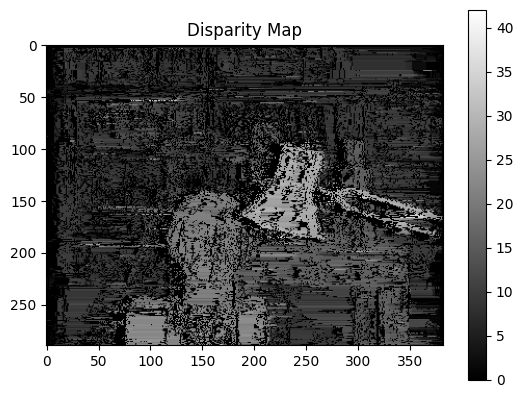

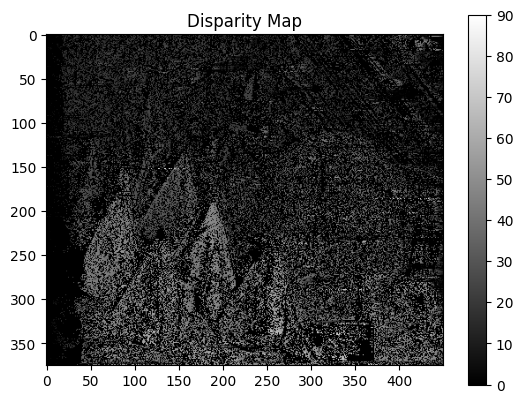

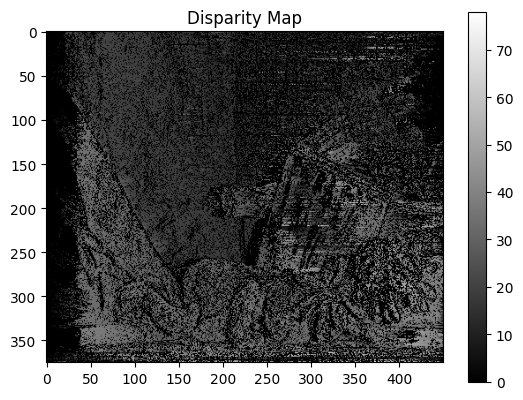

In [22]:
# Main function to test the implementation
if __name__ == "__main__":
    for i in range(1,4):
        disparity_map = compute_disparity_dynamic_programming(cv2.imread(f'l{i}.png', cv2.IMREAD_GRAYSCALE),cv2.imread(f'r{i}.png', cv2.IMREAD_GRAYSCALE) )
        display_disparity_map(disparity_map)

## Window size = 30

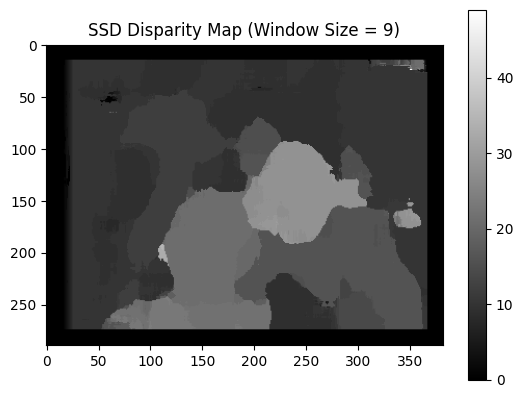

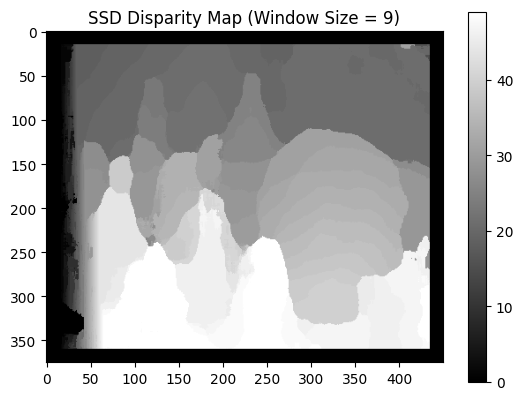

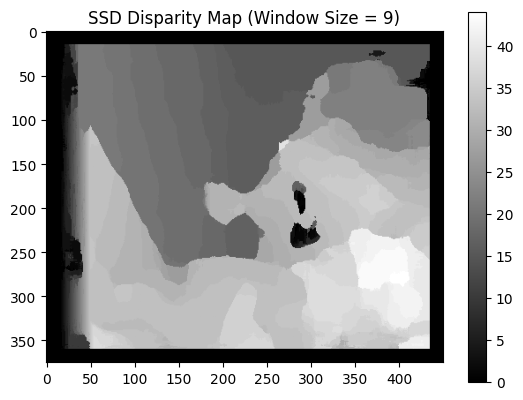

In [21]:
# Main function to test the implementation
if __name__ == "__main__":
    for i in range(1,4):
        ssd_disparity = compute_ssd(cv2.imread(f'l{i}.png', cv2.IMREAD_GRAYSCALE),cv2.imread(f'r{i}.png', cv2.IMREAD_GRAYSCALE) , 30)
        display_disparity_map(ssd_disparity, f"SSD Disparity Map (Window Size = {30})")

## Bonus

C:\Users\02rad\AppData\Local\Temp\ipykernel_24104\1543104112.py:21: RuntimeWarning: overflow encountered in scalar subtract
  match_cost = ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2
C:\Users\02rad\AppData\Local\Temp\ipykernel_24104\1543104112.py:34: RuntimeWarning: overflow encountered in scalar subtract
  if i > 0 and j > 0 and D[i, j] == D[i - 1, j - 1] + ((left_scanline[i] - right_scanline[j]) ** 2) / sigma**2:
C:\Users\02rad\AppData\Local\Temp\ipykernel_24104\1543104112.py:12: RuntimeWarning: overflow encountered in scalar subtract
  D[0, 0] = ((left_scanline[0] - right_scanline[0]) ** 2) / sigma**2


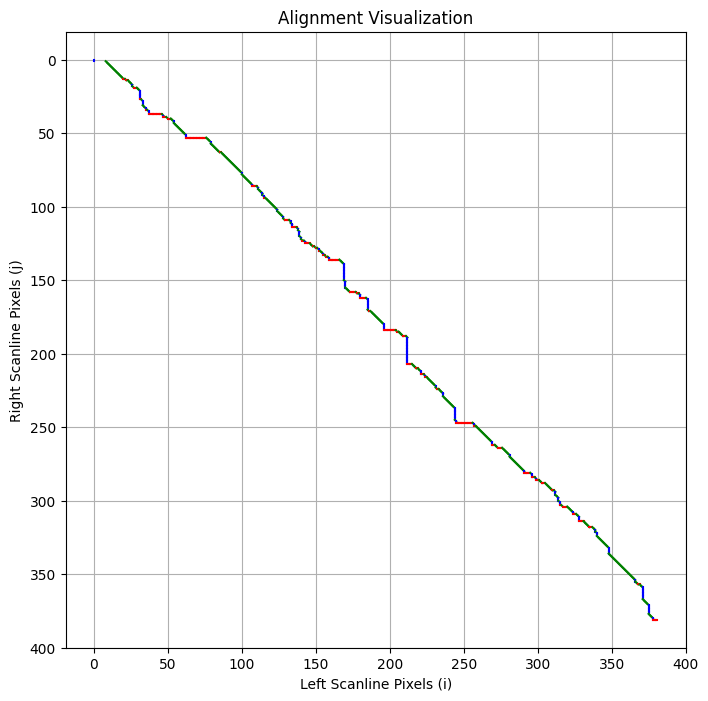

In [34]:
i=1
disparity_map = compute_disparity_dynamic_programming(cv2.imread(f'l{i}.png', cv2.IMREAD_GRAYSCALE),cv2.imread(f'r{i}.png', cv2.IMREAD_GRAYSCALE) )